In [1]:
%load_ext autoreload

%autoreload 2

In [8]:
import sys
sys.path.append('/Users/c.kieslich/Box Sync/Research/featureSelection/')

from mistic.svmSet import svmSet
from mistic.cvSet import cvSet 
from mistic.utility import combined_rank, kernelWrapper, score_svc, perDiff, paramSet

from FFTpro.features import SequenceSet, SequenceFFT 
from FFTpro.embeddings import b100

import matplotlib.pyplot as plt   
import numpy as np
import pandas as pd
import copy

from sklearn.preprocessing import StandardScaler, MinMaxScaler 
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

In [9]:
# Import peptide database
training_set = pd.read_csv("CPP_training.csv", sep = ",") 
testing_set = pd.read_csv("CPP_independent.csv", sep = ",") 

In [12]:
training_fft = SequenceSet(embedding = b100)
training_fft.from_sequence_list(training_set.Sequence,
                                attributes = {'Class':training_set.Class,'ID':training_set.index})
training_feats = training_fft.export_datatable(spectra = ['spectra'], 
                                               attributes = ['Class','ID'],
                                               compute_phase = False)

testing_fft = SequenceSet(embedding = b100)
testing_fft.from_sequence_list(testing_set.Sequence,
                               attributes = {'Class':testing_set.Class,'ID':testing_set.index})

testing_feats = testing_fft.export_datatable(spectra = ['spectra'], 
                                             attributes = ['Class','ID'],
                                             compute_phase = False)

testing_feats

,Class,ID,Amp_A_0.0,Amp_A_0.015625,Amp_A_0.03125,Amp_A_0.0625,Amp_A_0.125,Amp_A_0.25,Amp_A_0.5,Amp_R_0.0,...,Amp_Y_0.125,Amp_Y_0.25,Amp_Y_0.5,Amp_V_0.0,Amp_V_0.015625,Amp_V_0.03125,Amp_V_0.0625,Amp_V_0.125,Amp_V_0.25,Amp_V_0.5
0,Positive,0,15.0,14.704983,13.841854,10.706847,2.606685,9.433981,7.0,5.0,...,3.015520,6.403124,7.0,5.0,5.088985,5.317270,5.805283,4.693553,3.605551,19.0
1,Positive,1,2.0,10.555914,22.521377,17.614806,17.491173,26.000000,34.0,33.0,...,10.618153,17.204651,114.0,15.0,21.094101,20.088607,23.187860,9.379262,9.219544,103.0
2,Positive,2,20.0,23.431727,27.556932,18.987877,30.299438,29.427878,2.0,6.0,...,3.513281,2.000000,108.0,20.0,16.046636,8.835536,5.246138,14.162222,4.000000,44.0
3,Positive,3,5.0,6.654500,10.549879,16.504613,12.414214,3.000000,15.0,69.0,...,11.828427,9.000000,109.0,9.0,11.235802,14.702446,13.410368,8.071068,5.000000,99.0
4,Positive,4,7.0,2.692200,12.366511,25.446029,41.979149,9.848858,15.0,30.0,...,17.242580,15.556349,108.0,13.0,13.270153,12.972060,12.541170,14.464626,38.948684,69.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1622,Negative,1622,8.0,7.892627,7.555771,6.063747,2.000000,0.000000,24.0,3.0,...,19.026298,14.142136,22.0,23.0,22.354867,20.496496,14.172290,7.000000,26.172505,11.0
1623,Negative,1623,20.0,16.467845,8.474754,9.779530,9.106140,18.867962,32.0,0.0,...,19.294168,26.248809,71.0,13.0,15.201100,17.487711,7.630437,17.313854,14.317821,77.0
1624,Negative,1624,19.0,10.039506,15.334643,18.984531,12.889809,11.180340,85.0,67.0,...,31.482944,20.591260,124.0,42.0,34.650427,27.792960,29.820436,6.386358,30.594117,138.0
1625,Negative,1625,7.0,1.093272,10.555662,2.212610,19.514696,15.132746,65.0,39.0,...,29.892363,31.240999,144.0,10.0,23.552812,26.093085,31.969557,37.817070,37.656341,80.0


In [13]:
# Scale input X
X = training_feats.copy()
X.drop(columns=['ID','Class'],inplace=True)
scaler = StandardScaler()
scaler.fit(X)

StandardScaler()

In [14]:
X_train = scaler.transform(X)
y_train = training_feats.Class

X_val = testing_feats.copy()
X_val.drop(columns=['ID','Class'],inplace=True)
X_test = scaler.transform(X_val)
y_test = testing_feats.Class

In [21]:
cv_set = cvSet(X = X_train, y = y_train.values)
cv_set.independent(num_sets = 3)

In [22]:
kernel_type = "rbf"

C_vals = [2**x for x in range(1,9)]
gamma_vals = [2**x for x in range(-8,1)]

parameter_grid = []
for cost in C_vals:
    for gamma in gamma_vals:
        parameter_grid.append(paramSet(model={"C": cost},kernel={"gamma": gamma}))

svc = SVC(kernel = 'precomputed', class_weight="balanced", probability=False)

test = svmSet(svc, cv_set,
              score_method = score_svc().score,
              kernel = kernelWrapper(type = kernel_type),
              separate_parameters = True)

test.tune_models(parameter_grid)
test.performance_ 

[{'f1': 0.823529411764706,
  'auc': 0.884041243459526,
  'score': 0.8537853276121159,
  'C': 2,
  'gamma': 0.0078125},
 {'f1': 0.8596491228070176,
  'auc': 0.9391351184979994,
  'score': 0.8993921206525084,
  'C': 16,
  'gamma': 0.0078125},
 {'f1': 0.8648648648648649,
  'auc': 0.9286703601108033,
  'score': 0.8967676124878341,
  'C': 8,
  'gamma': 0.015625},
 {'f1': 0.8532110091743119,
  'auc': 0.9146660510926439,
  'score': 0.8839385301334779,
  'C': 4,
  'gamma': 0.015625},
 {'f1': 0.8634361233480176,
  'auc': 0.928131732840874,
  'score': 0.8957839280944457,
  'C': 8,
  'gamma': 0.0078125}]

In [26]:
rank_weights = [0,0.25,0.50,0.75,1]

svm_set_ranks = []
for i in range(len(rank_weights)):
    print(f"Rank weight: {rank_weights[i]:.2f}")
    svm_set_ranks.append(svmSet(svc, cv_set,
                                score_method = score_svc().score,
                                kernel = kernelWrapper(type = kernel_type),
                                separate_feature_sets = False,
                                separate_parameters = False,
                                sparse_kernel_matrix = False))

    svm_set_ranks[i].greedy_backward_selection(parameter_grid = parameter_grid,
                                           reduction_factor = 0.1,
                                           feature_ranker = combined_rank(weight=rank_weights[i]).compute,
                                           set_for_rank = "sample")

Rank weight: 0.00
Number of Features: 140, Score: 0.884
Number of Features: 125, Score: 0.894
Number of Features: 112, Score: 0.891
Number of Features: 100, Score: 0.891
Number of Features: 89, Score: 0.891
Number of Features: 80, Score: 0.883
Number of Features: 71, Score: 0.872
Number of Features: 63, Score: 0.856
Number of Features: 56, Score: 0.854
Number of Features: 50, Score: 0.853
Number of Features: 44, Score: 0.841
Number of Features: 39, Score: 0.836
Number of Features: 35, Score: 0.837
Number of Features: 31, Score: 0.795
Number of Features: 27, Score: 0.783
Number of Features: 24, Score: 0.771
Number of Features: 21, Score: 0.755
Number of Features: 18, Score: 0.732
Number of Features: 16, Score: 0.728
Number of Features: 14, Score: 0.712
Number of Features: 12, Score: 0.681
Number of Features: 10, Score: 0.668
Number of Features: 8, Score: 0.676
Number of Features: 7, Score: 0.670
Number of Features: 6, Score: 0.658
Number of Features: 5, Score: 0.660
Number of Features: 

In [27]:
svm_set_ranks[0].performance_

{'f1': 0.863495870088283,
 'auc': 0.9251923668821176,
 'score': 0.8943441184852002,
 'C': 32,
 'gamma': 0.0078125,
 'num_features': 125,
 'mean_nSV': 612.0}

In [28]:
C_vals = [2**x for x in range(1,9)]
gamma_vals = [2**x for x in range(-8,1)]

parameter_grid = []
for cost in C_vals:
    for gamma in gamma_vals:
        parameter_grid.append(paramSet(model={"C": cost},kernel={"gamma": gamma}))

svm_set_ranks[0].tune_models(parameter_grid)
svm_set_ranks[0].performance_

{'f1': 0.863495870088283,
 'auc': 0.9251923668821176,
 'score': 0.8943441184852002,
 'C': 32,
 'gamma': 0.0078125}

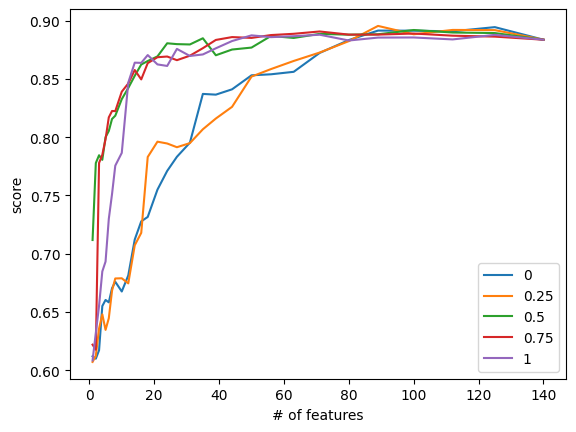

In [29]:
for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="score")

plt.legend(labels=rank_weights)

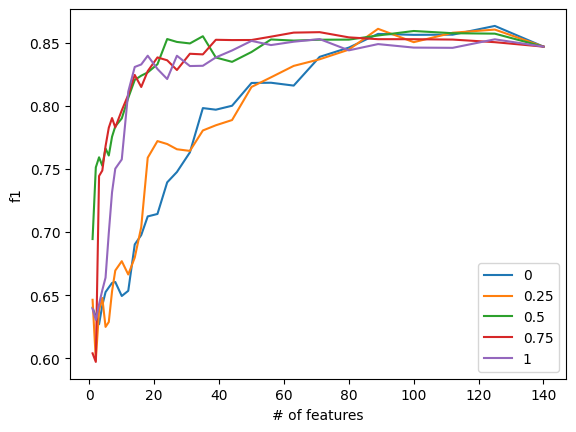

In [30]:
for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="f1")

plt.legend(labels=rank_weights)

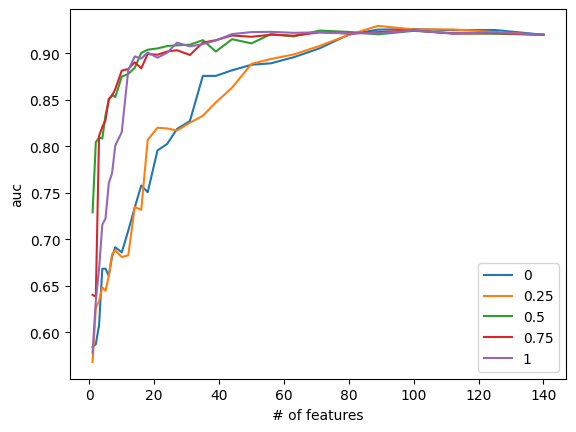

In [31]:
for i in range(len(rank_weights)):
    svm_set_ranks[i].plot_performance(metric="auc")

plt.legend(labels=rank_weights)

In [32]:
enrich_score = []
for i in range(len(rank_weights)):
    enrich_score.append(svm_set_ranks[i].enrichment_score(type='auc'))

selected_run = enrich_score.index(max(enrich_score))

enrich_score

[0.8338158912569923,
 0.8343749297935651,
 0.8710521068576252,
 0.869352980811119,
 0.8633374018458818]

In [33]:
from sklearn.metrics import roc_auc_score, confusion_matrix

decision_values = svm_set_ranks[selected_run].decision_function(X_test)
y_pred =  svm_set_ranks[selected_run].predict(X_test, use_voting = True)
#svm_set_ranks[selected_run].predict(X_test)

tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
precision = tp/(tp+fp)
recall = tp/(tp+fn)
f1 = 2*precision*recall/(precision+recall)

auc = roc_auc_score(y_test, decision_values)
            
blind_results = {'rank_weights': rank_weights[selected_run], 'number_features': len(svm_set_ranks[selected_run].features), 'f1': f1, 'auc': auc}

blind_results

{'rank_weights': 0.5,
 'number_features': 100,
 'f1': 0.5534591194968553,
 'auc': 0.9090428528099137}

In [35]:
from seaborn import pairplot, clustermap, load_dataset
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list, fcluster

linkMeth = "average"
selected_model = 0

IG = svm_set_ranks[selected_run].integrated_gradient(X_test, model_index = selected_model)

IGtable = pd.DataFrame(IG,columns=X.columns[svm_set_ranks[selected_run].features])

distMatCol = perDiff(IGtable)
hcCol = linkage(distMatCol, method=linkMeth,optimal_ordering=True)

tr_IGtable = IGtable.transpose()
distMatRow = perDiff(tr_IGtable)
hcRow = linkage(distMatRow, method=linkMeth,optimal_ordering=True)

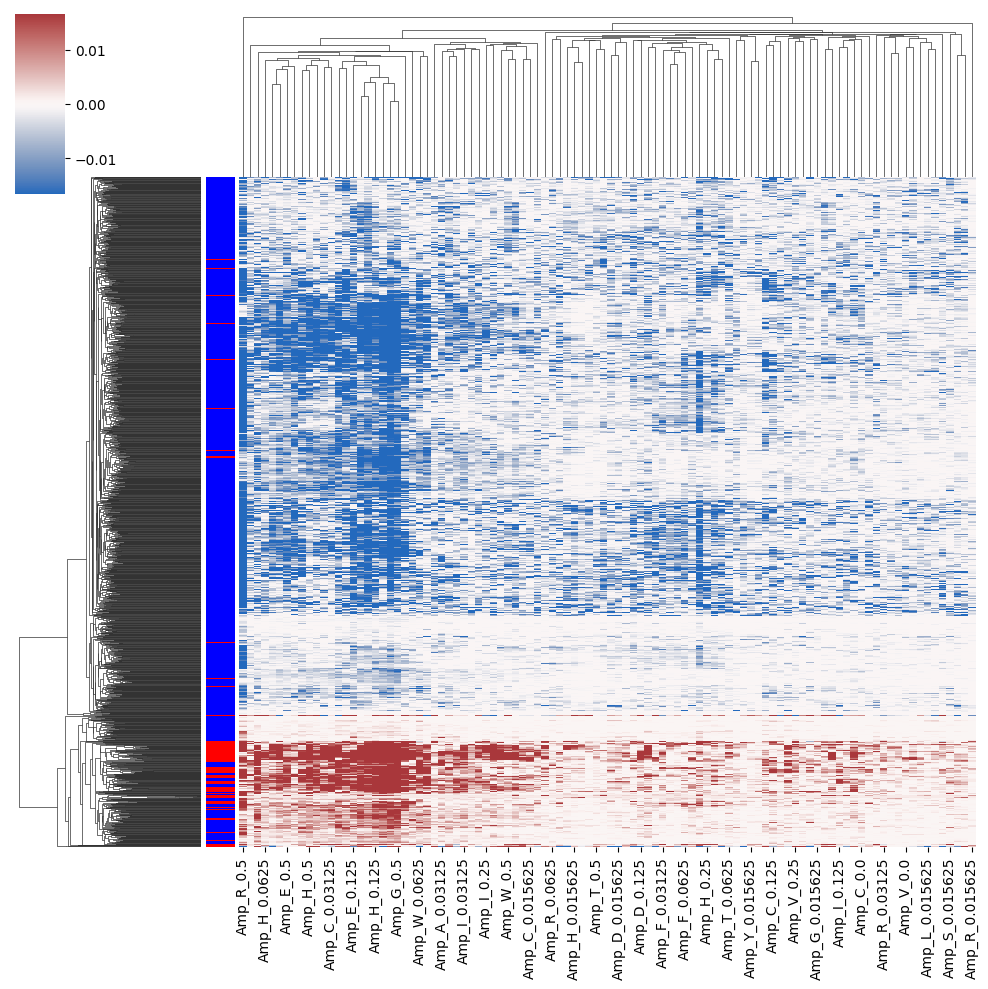

In [36]:
color_val = max(np.abs((np.mean(IG)-np.std(IG), np.mean(IG)+np.std(IG))))
clustermap(IGtable, 
           yticklabels=False,
           cmap="vlag", vmin=-color_val, vmax=color_val,
           row_linkage=hcRow, col_linkage=hcCol, 
           row_colors=[["red","blue"][int(l!="Positive")+0] for l in y_test])

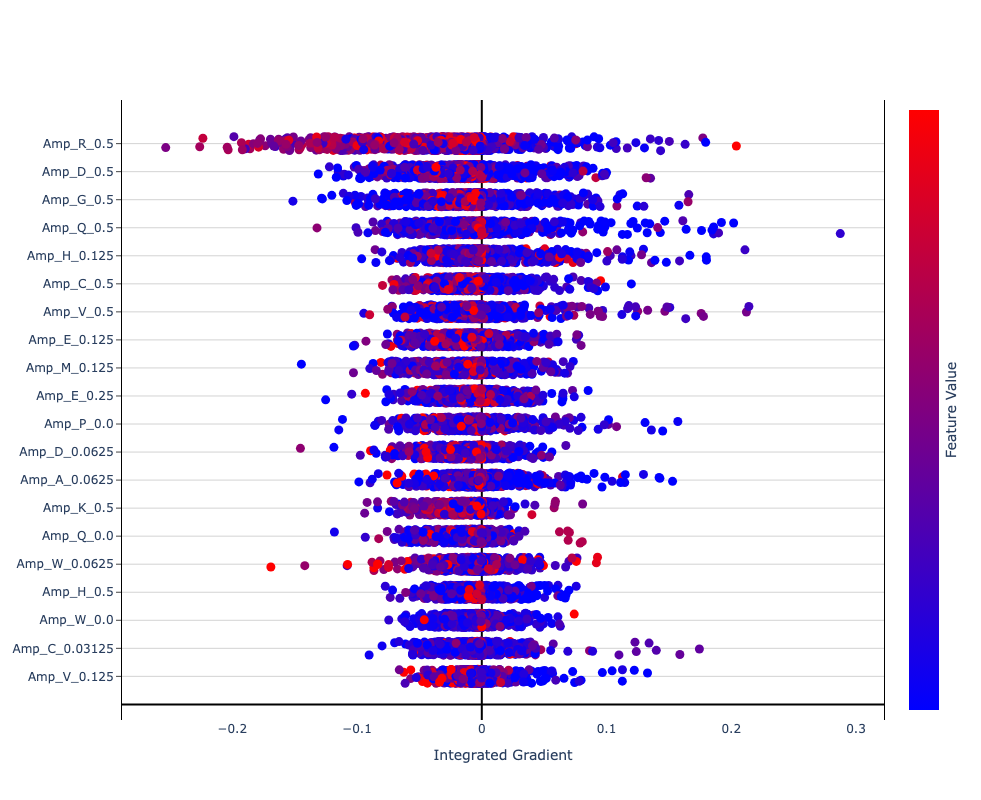

In [37]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

features = svm_set_ranks[selected_run].features
df_X_test = pd.DataFrame(X_test[:,features],columns = IGtable.columns)
N = len(IGtable)

fig = go.Figure()
fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=800,
    height=800,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = "Integrated Gradient",
)

fig.update_xaxes(
    zeroline=True,
    zerolinecolor="black",
    )
    
fig.update_yaxes(
    zeroline=True,
    zerolinecolor="black",
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

num_features = 20
feature_order = np.argsort(np.sum(abs(IG),axis=0))[(len(features)-num_features):(len(features))]

y_val = 1
for f in feature_order:
    fig.add_trace(go.Scatter(
        x = IGtable.iloc[:,f], 
        y = y_val + np.random.rand(N)*0.5 - 0.25,
        mode = 'markers',
        marker = dict(size=9,
                      color = df_X_test.iloc[:,f],
                      coloraxis = "coloraxis",
                     ),
        name=IGtable.columns[f],
    ))
    y_val += 1


fig.update_layout(showlegend=False, coloraxis_showscale=True)
fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text="Feature Value",side = "right"),
                    cmin = -1, cmax = 2)
fig.update_yaxes(tickvals=[i for i in range(1,len(feature_order)+1)], ticktext=IGtable.columns[feature_order])
fig.show() 

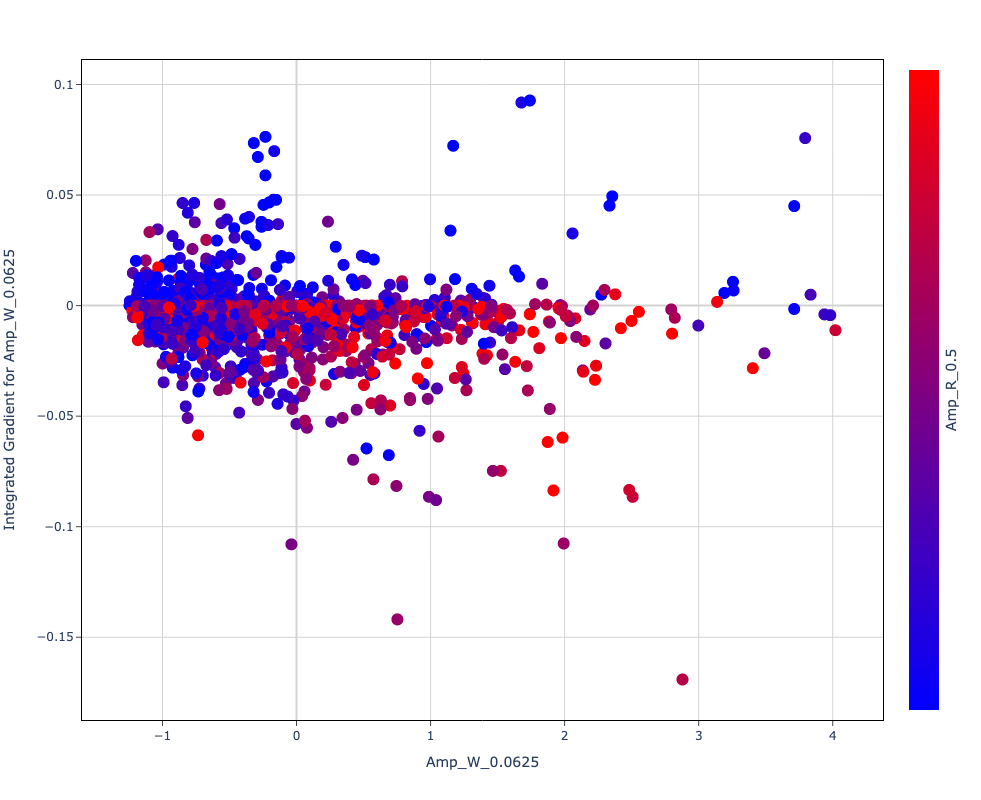

In [38]:
feat_1 = "Amp_W_0.0625"
feat_2 = "Amp_R_0.5"

fig = px.scatter(x = df_X_test[feat_1], y = IGtable[feat_1], color = df_X_test[feat_2])
fig.update_traces(marker=dict(size=12))

fig.update_layout(
    plot_bgcolor='white',
    autosize=False,
    width=800,
    height=800,
    coloraxis = {'colorscale':'Bluered'},
    xaxis_title = feat_1,
    yaxis_title = "Integrated Gradient for " + feat_1,
)

fig.update_xaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
    )
    
fig.update_yaxes(
    zeroline=True,
    zerolinecolor='lightgrey',
    mirror=True,
    ticks='outside',
    showline=True,
    linecolor='black',
    gridcolor='lightgrey'
)

fig.update_coloraxes(colorbar_showticklabels=False,
                    colorbar_title=dict(text=feat_2,side = "right"),
                    cmin = -1, cmax = 2)

fig.show()